In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [ ]:
!ls /gdrive/MyDrive/Classroom/'Pasta Compartilhada - Constatação de Proficiência'\/Datasets 

vendas_11_clean.csv  vendas_27_clean.csv  vendas_57_clean.csv
vendas_15_clean.csv  vendas_31_clean.csv  vendas_58_clean.csv
vendas_18_clean.csv  vendas_36_clean.csv  vendas_5_clean.csv
vendas_1_clean.csv   vendas_37_clean.csv  vendas_67_clean.csv
vendas_20_clean.csv  vendas_3_clean.csv   vendas_69_clean.csv
vendas_22_clean.csv  vendas_45_clean.csv  vendas_72_clean.csv
vendas_23_clean.csv  vendas_46_clean.csv


In [44]:
import numpy as np
import pandas as pd
from os import listdir

In [45]:
import matplotlib.pyplot as plt

In [46]:
pd.read_csv('/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_1_clean.csv')

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia
0,0,2019-08-07,1,CE,60025-001,A,70,29,1,0,28,$10.30,1,$10.30,Promo Bronze,0,$nan,$nan
1,1,2019-06-27,1,CE,60025-001,A,70,4,2,0,2,$9.78,2,$9.78,Promo Gold,0,$nan,$nan
2,2,2019-08-20,1,CE,60025-001,A,34,137,3,3,135,$14.15,3,$14.15,Promo Bronze,0,$nan,$nan
3,3,2019-07-08,1,CE,60025-001,A,102,2,1,0,1,$12.02,1,$12.02,Promo Gold,0,$nan,$nan
4,4,2019-03-16,1,CE,60025-001,A,34,337,3,5,338,$12.87,3,$12.87,Promo Gold,0,$13.95,$18.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346893,346893,2019-09-02,1,CE,60025-001,A,53984,12,1,1,12,$15.29,1,$15.29,Encarte,0,$nan,$nan
346894,346894,2019-03-15,1,CE,60025-001,A,53223,4,1,0,3,$42.25,1,$42.25,Promo Bronze,0,$48.65,$57.94
346895,346895,2019-08-05,1,CE,60025-001,A,53459,5,1,0,4,$31.70,1,$31.70,Promo Venda,0,$nan,$nan
346896,346896,2019-07-02,1,CE,60025-001,A,53466,3,1,0,2,$19.99,0,$0.00,SEMPROMOCAO,0,$19.99,$19.19


In [47]:
vendas1 = pd.read_csv('/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_1_clean.csv')

In [49]:
vendas1['DATA_MOVIMENTO'] = pd.to_datetime(vendas1['DATA_MOVIMENTO'])

In [50]:
vendas1['DIA_DA_SEMANA']= vendas1['DATA_MOVIMENTO'].dt.weekday

In [59]:
vendas1=vendas1.drop(['valorempresa', 'valorconcorrencia','valorconcorrencia'], axis=1)

In [60]:
vendas1

,Unnamed: 0,CODIGO_FILIAL,CEP_FILIAL,STATUS_FILIAL,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,DIA_DA_SEMANA
0,322691,1,60025-001,A,9,1,1,8,1,0,4
1,117713,1,60025-001,A,6,1,0,4,0,0,4
2,55079,1,60025-001,A,7,1,1,7,1,0,4
3,55060,1,60025-001,A,319,10,0,302,10,0,4
4,9117,1,60025-001,A,7,2,0,5,2,0,4
...,...,...,...,...,...,...,...,...,...,...,...
346893,345005,1,60025-001,A,10,2,0,8,2,0,2
346894,306406,1,60025-001,A,14,1,0,13,1,0,2
346895,169370,1,60025-001,A,19,2,6,23,2,0,2
346896,197599,1,60025-001,A,8,2,0,6,2,0,2


In [56]:
## formata a saída de números float
pd.options.display.float_format = '${:,.2f}'.format

In [57]:
vendas1

,Unnamed: 0,CODIGO_FILIAL,CEP_FILIAL,STATUS_FILIAL,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_DA_SEMANA
0,322691,1,60025-001,A,9,1,1,8,1,0,$nan,$nan,4
1,117713,1,60025-001,A,6,1,0,4,0,0,$nan,$nan,4
2,55079,1,60025-001,A,7,1,1,7,1,0,$6.80,$7.33,4
3,55060,1,60025-001,A,319,10,0,302,10,0,$4.35,$3.93,4
4,9117,1,60025-001,A,7,2,0,5,2,0,$61.50,$57.07,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
346893,345005,1,60025-001,A,10,2,0,8,2,0,$nan,$nan,2
346894,306406,1,60025-001,A,14,1,0,13,1,0,$nan,$nan,2
346895,169370,1,60025-001,A,19,2,6,23,2,0,$nan,$nan,2
346896,197599,1,60025-001,A,8,2,0,6,2,0,$nan,$nan,2


In [ ]:
#criando coluna para dia, mês e ano
vendas1["DIA_VENDA"], vendas1["MES_VENDA"], vendas1["ANO_VENDA"] = (vendas1["DATA_MOVIMENTO"].dt.day, vendas1["DATA_MOVIMENTO"].dt.month, vendas1["DATA_MOVIMENTO"].dt.year)

In [ ]:
vendas1.columns

Index(['Unnamed: 0', 'DATA_MOVIMENTO', 'CODIGO_FILIAL', 'UF_FILIAL',
       'CEP_FILIAL', 'STATUS_FILIAL', 'CODIGO_PRODUTO', 'ESTOQUE_ANTERIOR',
       'MVVP_QT_PRD', 'QT_MOV_ENTRADA', 'ESTOQUE_FIM_DIA', 'PRECO_MEDIO_VENDA',
       'QTD_VENDA_PROMOCAO', 'PRECO_LIQUIDO_MEDIO', 'TIPO_PROMOCAO',
       'QTD_VENDA_ULTIMA_CHANCE', 'valorempresa', 'valorconcorrencia',
       'DIA_VENDA', 'MES_VENDA', 'ANO_VENDA'],
      dtype='object')

In [ ]:
vendas1

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA
0,0,2019-08-07,1,CE,60025-001,A,70,29,1,0,28,$10.30,1,$10.30,Promo Bronze,0,$nan,$nan,7,8,2019
1,1,2019-06-27,1,CE,60025-001,A,70,4,2,0,2,$9.78,2,$9.78,Promo Gold,0,$nan,$nan,27,6,2019
2,2,2019-08-20,1,CE,60025-001,A,34,137,3,3,135,$14.15,3,$14.15,Promo Bronze,0,$nan,$nan,20,8,2019
3,3,2019-07-08,1,CE,60025-001,A,102,2,1,0,1,$12.02,1,$12.02,Promo Gold,0,$nan,$nan,8,7,2019
4,4,2019-03-16,1,CE,60025-001,A,34,337,3,5,338,$12.87,3,$12.87,Promo Gold,0,$13.95,$18.57,16,3,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346893,346893,2019-09-02,1,CE,60025-001,A,53984,12,1,1,12,$15.29,1,$15.29,Encarte,0,$nan,$nan,2,9,2019
346894,346894,2019-03-15,1,CE,60025-001,A,53223,4,1,0,3,$42.25,1,$42.25,Promo Bronze,0,$48.65,$57.94,15,3,2019
346895,346895,2019-08-05,1,CE,60025-001,A,53459,5,1,0,4,$31.70,1,$31.70,Promo Venda,0,$nan,$nan,5,8,2019
346896,346896,2019-07-02,1,CE,60025-001,A,53466,3,1,0,2,$19.99,0,$0.00,SEMPROMOCAO,0,$19.99,$19.19,2,7,2019


In [51]:
## ordenando o dataframe pelos números dos códigos de filiais
vendas1.sort_values('DATA_MOVIMENTO', inplace=True, ignore_index=True)
vendas1

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_DA_SEMANA
0,322691,2019-03-01,1,CE,60025-001,A,43794,9,1,1,8,$57.38,1,$57.38,Promo Gold,0,$nan,$nan,4
1,117713,2019-03-01,1,CE,60025-001,A,32859,6,1,0,4,$3.80,0,$0.00,SEMPROMOCAO,0,$nan,$nan,4
2,55079,2019-03-01,1,CE,60025-001,A,19382,7,1,1,7,$7.01,1,$7.01,Promo Gold,0,$6.80,$7.33,4
3,55060,2019-03-01,1,CE,60025-001,A,18537,319,10,0,302,$3.85,10,$3.85,Promo Gold,0,$4.35,$3.93,4
4,9117,2019-03-01,1,CE,60025-001,A,1397,7,2,0,5,$62.10,2,$62.10,Promo Venda,0,$61.50,$57.07,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346893,345005,2019-09-11,1,CE,60025-001,A,52525,10,2,0,8,$2.19,2,$2.19,Encarte,0,$nan,$nan,2
346894,306406,2019-09-11,1,CE,60025-001,A,51519,14,1,0,13,$3.49,1,$3.49,Promo Venda,0,$nan,$nan,2
346895,169370,2019-09-11,1,CE,60025-001,A,39998,19,2,6,23,$100.36,2,$100.36,Promo Gold,0,$nan,$nan,2
346896,197599,2019-09-11,1,CE,60025-001,A,48147,8,2,0,6,$8.45,2,$8.45,Promo Venda,0,$nan,$nan,2


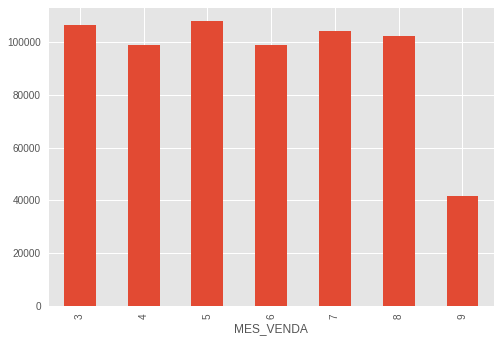

In [ ]:
#agrupando estoque inicial por mês
vendas1.groupby(vendas1["MES_VENDA"])["MVVP_QT_PRD"].sum().plot.bar()

In [ ]:
dfmovimento = vendas1
dfmovimento = vendas1[['DATA_MOVIMENTO','CODIGO_PRODUTO', 'ESTOQUE_ANTERIOR','MVVP_QT_PRD', 'QT_MOV_ENTRADA','ESTOQUE_FIM_DIA', 'QTD_VENDA_PROMOCAO']]
dfmovimento

,DATA_MOVIMENTO,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO
0,2019-03-01,43794,9,1,1,8,1
1,2019-03-01,32859,6,1,0,4,0
2,2019-03-01,19382,7,1,1,7,1
3,2019-03-01,18537,319,10,0,302,10
4,2019-03-01,1397,7,2,0,5,2
...,...,...,...,...,...,...,...
346893,2019-09-11,52525,10,2,0,8,2
346894,2019-09-11,51519,14,1,0,13,1
346895,2019-09-11,39998,19,2,6,23,2
346896,2019-09-11,48147,8,2,0,6,2


In [ ]:
dfmovimento['VENDASDIA'] = ((vendas1['MVVP_QT_PRD']) - ( vendas1['QTD_VENDA_PROMOCAO']))
dfmovimento

,DATA_MOVIMENTO,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,VENDASDIA
0,2019-03-01,43794,9,1,1,8,1,0
1,2019-03-01,32859,6,1,0,4,0,1
2,2019-03-01,19382,7,1,1,7,1,0
3,2019-03-01,18537,319,10,0,302,10,0
4,2019-03-01,1397,7,2,0,5,2,0
...,...,...,...,...,...,...,...,...
346893,2019-09-11,52525,10,2,0,8,2,0
346894,2019-09-11,51519,14,1,0,13,1,0
346895,2019-09-11,39998,19,2,6,23,2,0
346896,2019-09-11,48147,8,2,0,6,2,0


In [ ]:
## criando a coluna faturamento
dfmovimento['VENDASEMPROMOCAO'] = ((vendas1['MVVP_QT_PRD']) - ( vendas1['QTD_VENDA_PROMOCAO']))

In [ ]:
dfmovimento['VENDASEMPROMOCAO'] = ((vendas1['MVVP_QT_PRD']) - ( vendas1['QTD_VENDA_PROMOCAO']))
dfmovimento

,DATA_MOVIMENTO,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,VENDASDIA,VENDASEMPROMOCAO
0,2019-03-01,43794,9,1,1,8,1,0,0
1,2019-03-01,32859,6,1,0,4,0,1,1
2,2019-03-01,19382,7,1,1,7,1,0,0
3,2019-03-01,18537,319,10,0,302,10,0,0
4,2019-03-01,1397,7,2,0,5,2,0,0
...,...,...,...,...,...,...,...,...,...
346893,2019-09-11,52525,10,2,0,8,2,0,0
346894,2019-09-11,51519,14,1,0,13,1,0,0
346895,2019-09-11,39998,19,2,6,23,2,0,0
346896,2019-09-11,48147,8,2,0,6,2,0,0


In [ ]:
vendas1.query('PRECO_LIQUIDO_MEDIO == 0').head(10)

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA
1,117713,2019-03-01,1,CE,60025-001,A,32859,6,1,0,4,$3.80,0,$0.00,SEMPROMOCAO,0,$nan,$nan,1,3,2019
37,116363,2019-03-01,1,CE,60025-001,A,32627,5,1,0,4,$5.69,0,$0.00,SEMPROMOCAO,0,$6.99,$6.49,1,3,2019
72,120284,2019-03-01,1,CE,60025-001,A,29743,1,1,0,0,$33.29,0,$0.00,SEMPROMOCAO,0,$33.49,$28.47,1,3,2019
75,273174,2019-03-01,1,CE,60025-001,A,47712,11,2,0,7,$4.10,0,$0.00,SEMPROMOCAO,0,$nan,$nan,1,3,2019
76,198027,2019-03-01,1,CE,60025-001,A,43330,6,1,0,5,$9.49,0,$0.00,SEMPROMOCAO,0,$9.45,$9.75,1,3,2019
131,313499,2019-03-01,1,CE,60025-001,A,40734,59,1,2,59,$18.90,0,$0.00,SEMPROMOCAO,0,$18.90,$18.90,1,3,2019
184,110690,2019-03-01,1,CE,60025-001,A,32626,4,2,1,2,$5.69,0,$0.00,SEMPROMOCAO,0,$6.99,$6.49,1,3,2019
191,110347,2019-03-01,1,CE,60025-001,A,32058,2,1,0,1,$5.69,0,$0.00,SEMPROMOCAO,0,$6.99,$6.99,1,3,2019
199,201728,2019-03-01,1,CE,60025-001,A,42654,4,3,0,0,$10.16,3,$0.00,Desconto Cupom,0,$12.60,$14.64,1,3,2019
205,310705,2019-03-01,1,CE,60025-001,A,42926,5,1,0,4,$45.99,0,$0.00,SEMPROMOCAO,0,$44.99,$46.01,1,3,2019


In [ ]:
vendas1.query('PRECO_LIQUIDO_MEDIO == 0').shape

(8493, 21)

In [ ]:
vendas1.query('PRECO_MEDIO_VENDA == 0').shape

(4, 21)

In [ ]:
vendas1.query('MVVP_QT_PRD == 0').shape

(0, 21)

In [ ]:
vendas1.query('PRECO_MEDIO_VENDA == 0').head()

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA
76295,345882,2019-04-11,1,CE,60025-001,A,53012,44,1,0,43,$0.00,1,$0.00,Desconto Proprio,0,$nan,$nan,11,4,2019
79289,265440,2019-04-13,1,CE,60025-001,A,53012,40,1,0,36,$0.00,1,$0.00,Desconto Proprio,0,$nan,$nan,13,4,2019
88601,286042,2019-04-18,1,CE,60025-001,A,50420,56,1,0,54,$0.00,1,$0.00,Desconto Proprio,0,$nan,$nan,18,4,2019
92218,250090,2019-04-21,1,CE,60025-001,A,51317,129,1,0,128,$0.00,1,$0.00,Desconto Proprio,0,$nan,$nan,21,4,2019


In [ ]:
dfmovimento.query('CODIGO_PRODUTO == 43794 & MVVP_QT_PRD > 0').head(5)

,DATA_MOVIMENTO,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,VENDASDIA,VENDASEMPROMOCAO
0,2019-03-01,43794,9,1,1,8,1,0,0
2165,2019-03-01,43794,9,1,1,8,1,0,0
5702,2019-03-03,43794,9,1,0,8,1,0,0
9604,2019-03-06,43794,8,1,0,7,1,0,0
13405,2019-03-08,43794,9,4,1,5,4,0,0


In [ ]:
dfmovimento.query('CODIGO_PRODUTO == 43794').head(10)

,DATA_MOVIMENTO,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,VENDASDIA,VENDASEMPROMOCAO
0,2019-03-01,43794,9,1,1,8,1,0,0
2165,2019-03-01,43794,9,1,1,8,1,0,0
5702,2019-03-03,43794,9,1,0,8,1,0,0
9604,2019-03-06,43794,8,1,0,7,1,0,0
13405,2019-03-08,43794,9,4,1,5,4,0,0
13530,2019-03-08,43794,9,1,1,5,0,1,1
14616,2019-03-09,43794,4,1,0,3,1,0,0
23556,2019-03-14,43794,8,1,0,7,1,0,0
26514,2019-03-15,43794,7,1,0,6,1,0,0
26959,2019-03-16,43794,6,1,0,5,1,0,0


In [ ]:
dfmovimento.query('MVVP_QT_PRD == 0').head(5)

,DATA_MOVIMENTO,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,VENDASDIA,VENDASEMPROMOCAO


In [ ]:
vendas1['MVVP_QT_PRD'].value_counts()

1      227150
2       63348
3       25123
4       11329
5        5689
        ...  
112         1
120         1
122         1
123         1
62          1
Name: MVVP_QT_PRD, Length: 132, dtype: int64

In [ ]:
vendas1['PRECO_MEDIO_VENDA'].value_counts().head(10)

$0.01    6053
$2.99    4041
$3.99    2472
$7.99    2337
$4.99    1778
$9.99    1714
$5.49    1605
$5.00    1603
$9.90    1556
$1.99    1545
Name: PRECO_MEDIO_VENDA, dtype: int64

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].DATA_MOVIMENTO.value_counts()

2019-08-09    5
2019-07-12    5
2019-08-19    5
2019-07-13    4
2019-07-31    4
             ..
2019-03-25    2
2019-03-24    2
2019-08-05    1
2019-08-03    1
2019-08-06    1
Name: DATA_MOVIMENTO, Length: 193, dtype: int64

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].TIPO_PROMOCAO.value_counts()

Promo Gold          186
Promo Bronze        181
SEMPROMOCAO         138
Desconto Cupom       34
Promo Venda          11
Acordo                6
Desconto Proprio      5
Name: TIPO_PROMOCAO, dtype: int64

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].MVVP_QT_PRD.sum()

7494

In [ ]:
vendas_dia = vendas1["CODIGO_PRODUTO"],vendas1.groupby(vendas1["DATA_MOVIMENTO"])["MVVP_QT_PRD"].sum()
vendas_dia

(0         43794
 1         32859
 2         19382
 3         18537
 4          1397
           ...  
 346893    52525
 346894    51519
 346895    39998
 346896    48147
 346897    17694
 Name: CODIGO_PRODUTO, Length: 346898, dtype: int64, DATA_MOVIMENTO
 2019-03-01    5813
 2019-03-02    3358
 2019-03-03    2500
 2019-03-04    2451
 2019-03-05    2064
               ... 
 2019-09-07    3137
 2019-09-08    2923
 2019-09-09    3255
 2019-09-10    3793
 2019-09-11    5069
 Name: MVVP_QT_PRD, Length: 195, dtype: int64)

In [ ]:
vendas_dia = vendas1.groupby(vendas1["DATA_MOVIMENTO"]), vendas1.groupby(vendas1["CODIGO_PRODUTO"]) ["MVVP_QT_PRD"].sum()
vendas_dia

(<pandas.core.groupby.generic.DataFrameGroupBy object at 0x7f8252403090>,
 CODIGO_PRODUTO
 1          8
 8        244
 9        182
 10       391
 11         1
         ... 
 54470      5
 54472      1
 54473      6
 54474      1
 54477      3
 Name: MVVP_QT_PRD, Length: 11542, dtype: int64)

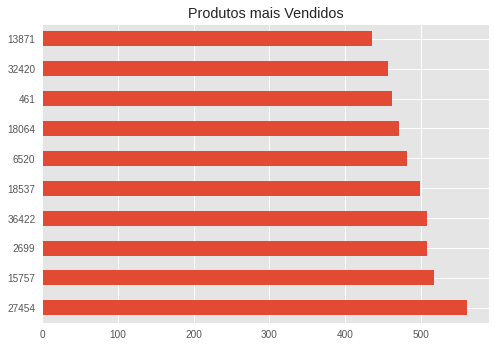

In [ ]:
vendas1[u'CODIGO_PRODUTO'].value_counts().head(10).plot.barh(title="Produtos mais Vendidos")

In [ ]:
vendas_dia = vendas1.groupby(vendas1["CODIGO_PRODUTO"]),vendas1.groupby(vendas1["DATA_MOVIMENTO"])["MVVP_QT_PRD"].sum()
vendas_dia

(<pandas.core.groupby.generic.DataFrameGroupBy object at 0x7f82524f22d0>,
 DATA_MOVIMENTO
 2019-03-01    5813
 2019-03-02    3358
 2019-03-03    2500
 2019-03-04    2451
 2019-03-05    2064
               ... 
 2019-09-07    3137
 2019-09-08    2923
 2019-09-09    3255
 2019-09-10    3793
 2019-09-11    5069
 Name: MVVP_QT_PRD, Length: 195, dtype: int64)

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].PRECO_MEDIO_VENDA.mean()

6.484388587188591

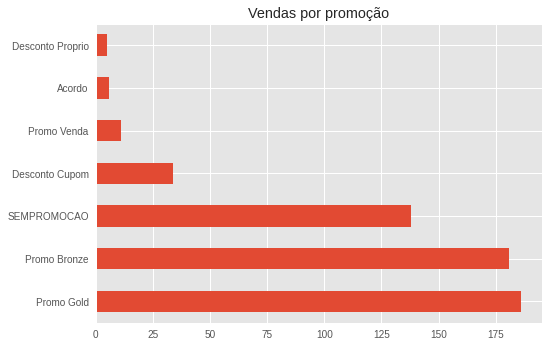

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].TIPO_PROMOCAO.value_counts().plot.barh(title="Vendas por promoção")

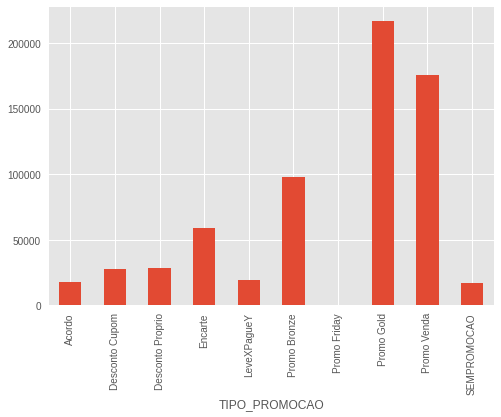

In [ ]:
vendas1.groupby(vendas1["TIPO_PROMOCAO"])["MVVP_QT_PRD"].sum().plot.bar()

In [ ]:
vendas1.groupby(vendas1["TIPO_PROMOCAO"])["MVVP_QT_PRD"].sum()

TIPO_PROMOCAO
Acordo               17658
Desconto Cupom       27662
Desconto Proprio     28296
Encarte              59013
LeveXPagueY          19234
Promo Bronze         97899
Promo Friday           349
Promo Gold          217113
Promo Venda         175710
SEMPROMOCAO          16827
Name: MVVP_QT_PRD, dtype: int64

In [ ]:
vendas1.groupby(vendas1["TIPO_PROMOCAO"])["MVVP_QT_PRD"].sum()

TIPO_PROMOCAO
Acordo               17658
Desconto Cupom       27662
Desconto Proprio     28296
Encarte              59013
LeveXPagueY          19234
Promo Bronze         97899
Promo Friday           349
Promo Gold          217113
Promo Venda         175710
SEMPROMOCAO          16827
Name: MVVP_QT_PRD, dtype: int64

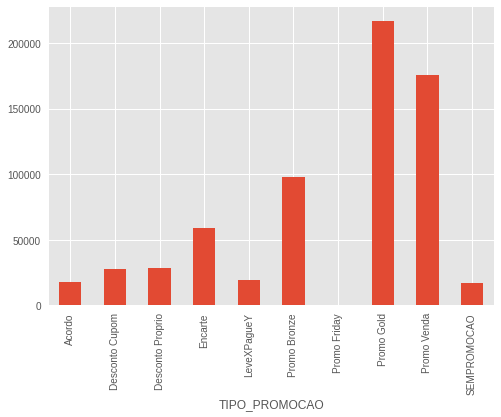

In [ ]:
vendas1.groupby(vendas1["TIPO_PROMOCAO"])["MVVP_QT_PRD"].sum().plot.bar()

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==100)].MVVP_QT_PRD.sum()

335

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==100)].TIPO_PROMOCAO.value_counts()

Promo Gold          84
Promo Bronze        29
Desconto Cupom       9
Desconto Proprio     1
Acordo               1
Name: TIPO_PROMOCAO, dtype: int64

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].TIPO_PROMOCAO.value_counts()

Promo Gold          186
Promo Bronze        181
SEMPROMOCAO         138
Desconto Cupom       34
Promo Venda          11
Acordo                6
Desconto Proprio      5
Name: TIPO_PROMOCAO, dtype: int64

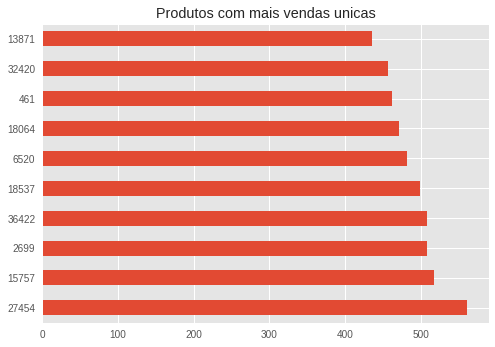

In [ ]:
vendas1[u'CODIGO_PRODUTO'].value_counts().head(10).plot.barh(title="Produtos com mais vendas unicas")

In [ ]:
vendas1[u'TIPO_PROMOCAO'].value_counts()

Promo Venda         105819
Promo Gold           96755
Promo Bronze         61353
Encarte              31044
Desconto Proprio     14686
Desconto Cupom       10431
Acordo                9457
LeveXPagueY           8976
SEMPROMOCAO           8091
Promo Friday           242
Name: TIPO_PROMOCAO, dtype: int64

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].TIPO_PROMOCAO.value_counts()

Promo Gold          186
Promo Bronze        181
SEMPROMOCAO         138
Desconto Cupom       34
Promo Venda          11
Acordo                6
Desconto Proprio      5
Name: TIPO_PROMOCAO, dtype: int64

In [ ]:
vendas1.columns

Index(['Unnamed: 0', 'DATA_MOVIMENTO', 'CODIGO_FILIAL', 'UF_FILIAL',
       'CEP_FILIAL', 'STATUS_FILIAL', 'CODIGO_PRODUTO', 'ESTOQUE_ANTERIOR',
       'MVVP_QT_PRD', 'QT_MOV_ENTRADA', 'ESTOQUE_FIM_DIA', 'PRECO_MEDIO_VENDA',
       'QTD_VENDA_PROMOCAO', 'PRECO_LIQUIDO_MEDIO', 'TIPO_PROMOCAO',
       'QTD_VENDA_ULTIMA_CHANCE', 'valorempresa', 'valorconcorrencia',
       'DIA_VENDA', 'MES_VENDA', 'ANO_VENDA'],
      dtype='object')

In [ ]:
vendas1.shape

(346898, 21)

In [ ]:
vendas1

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA
0,322691,2019-03-01,1,CE,60025-001,A,43794,9,1,1,8,$57.38,1,$57.38,Promo Gold,0,$nan,$nan,1,3,2019
1,117713,2019-03-01,1,CE,60025-001,A,32859,6,1,0,4,$3.80,0,$0.00,SEMPROMOCAO,0,$nan,$nan,1,3,2019
2,55079,2019-03-01,1,CE,60025-001,A,19382,7,1,1,7,$7.01,1,$7.01,Promo Gold,0,$6.80,$7.33,1,3,2019
3,55060,2019-03-01,1,CE,60025-001,A,18537,319,10,0,302,$3.85,10,$3.85,Promo Gold,0,$4.35,$3.93,1,3,2019
4,9117,2019-03-01,1,CE,60025-001,A,1397,7,2,0,5,$62.10,2,$62.10,Promo Venda,0,$61.50,$57.07,1,3,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346893,345005,2019-09-11,1,CE,60025-001,A,52525,10,2,0,8,$2.19,2,$2.19,Encarte,0,$nan,$nan,11,9,2019
346894,306406,2019-09-11,1,CE,60025-001,A,51519,14,1,0,13,$3.49,1,$3.49,Promo Venda,0,$nan,$nan,11,9,2019
346895,169370,2019-09-11,1,CE,60025-001,A,39998,19,2,6,23,$100.36,2,$100.36,Promo Gold,0,$nan,$nan,11,9,2019
346896,197599,2019-09-11,1,CE,60025-001,A,48147,8,2,0,6,$8.45,2,$8.45,Promo Venda,0,$nan,$nan,11,9,2019


In [ ]:
from os import listdir
from os.path import isfile, join

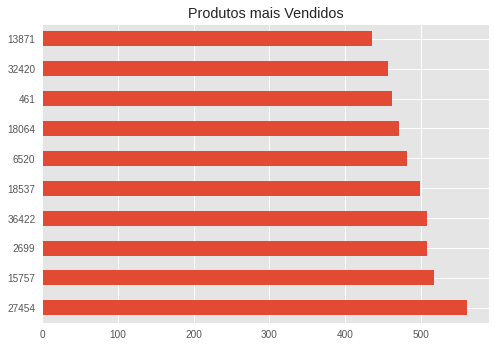

In [ ]:
vendas1[u'CODIGO_PRODUTO'].value_counts().head(10).plot.barh(title="Produtos mais Vendidos")

In [ ]:
vendas1.query('CODIGO_PRODUTO == 27454 & MVVP_QT_PRD > 0').head(5)

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA
810,92559,2019-03-01,1,CE,60025-001,A,27454,812,15,0,786,$6.20,15,$6.20,Promo Bronze,0,$nan,$nan,1,3,2019
1155,161809,2019-03-01,1,CE,60025-001,A,27454,812,11,0,786,$5.89,11,$5.89,Promo Gold,0,$nan,$nan,1,3,2019
2860,94592,2019-03-02,1,CE,60025-001,A,27454,786,6,0,774,$5.99,6,$5.99,Promo Gold,0,$nan,$nan,2,3,2019
3516,97554,2019-03-02,1,CE,60025-001,A,27454,786,6,0,774,$6.20,6,$6.20,Promo Bronze,0,$nan,$nan,2,3,2019
4424,140655,2019-03-03,1,CE,60025-001,A,27454,774,5,0,758,$6.20,5,$6.20,Promo Bronze,0,$nan,$nan,3,3,2019


In [ ]:
## criando a coluna faturamento
vendas1['FATURAMENTOliquido'] = ((vendas1['MVVP_QT_PRD']  * vendas1['PRECO_LIQUIDO_MEDIO']))

In [ ]:
## criando a coluna faturamento
vendas1['FATURAMENTOmedio'] = ((vendas1['MVVP_QT_PRD']  * vendas1['PRECO_MEDIO_VENDA']))

In [ ]:
vendas1.dtypes


Unnamed: 0                          int64
DATA_MOVIMENTO             datetime64[ns]
CODIGO_FILIAL                       int64
UF_FILIAL                          object
CEP_FILIAL                         object
STATUS_FILIAL                      object
CODIGO_PRODUTO                      int64
ESTOQUE_ANTERIOR                    int64
MVVP_QT_PRD                         int64
QT_MOV_ENTRADA                      int64
ESTOQUE_FIM_DIA                     int64
PRECO_MEDIO_VENDA                 float64
QTD_VENDA_PROMOCAO                  int64
PRECO_LIQUIDO_MEDIO               float64
TIPO_PROMOCAO                      object
QTD_VENDA_ULTIMA_CHANCE             int64
valorempresa                      float64
valorconcorrencia                 float64
DIA_VENDA                           int64
MES_VENDA                           int64
ANO_VENDA                           int64
FATURAMENTOliquido                float64
FATURAMENTOmedio                  float64
dtype: object

In [ ]:
vendas1['faturamento'] = vendas1['MVVP_QT_PRD'] * vendas1['PRECO_MEDIO_VENDA']

In [ ]:
vendas1

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA,FATURAMENTOliquido,FATURAMENTOmedio,faturamento
0,322691,2019-03-01,1,CE,60025-001,A,43794,9,1,1,8,$57.38,1,$57.38,Promo Gold,0,$nan,$nan,1,3,2019,$57.38,$57.38,$57.38
1,117713,2019-03-01,1,CE,60025-001,A,32859,6,1,0,4,$3.80,0,$0.00,SEMPROMOCAO,0,$nan,$nan,1,3,2019,$0.00,$3.80,$3.80
2,55079,2019-03-01,1,CE,60025-001,A,19382,7,1,1,7,$7.01,1,$7.01,Promo Gold,0,$6.80,$7.33,1,3,2019,$7.01,$7.01,$7.01
3,55060,2019-03-01,1,CE,60025-001,A,18537,319,10,0,302,$3.85,10,$3.85,Promo Gold,0,$4.35,$3.93,1,3,2019,$38.45,$38.45,$38.45
4,9117,2019-03-01,1,CE,60025-001,A,1397,7,2,0,5,$62.10,2,$62.10,Promo Venda,0,$61.50,$57.07,1,3,2019,$124.20,$124.20,$124.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346893,345005,2019-09-11,1,CE,60025-001,A,52525,10,2,0,8,$2.19,2,$2.19,Encarte,0,$nan,$nan,11,9,2019,$4.38,$4.38,$4.38
346894,306406,2019-09-11,1,CE,60025-001,A,51519,14,1,0,13,$3.49,1,$3.49,Promo Venda,0,$nan,$nan,11,9,2019,$3.49,$3.49,$3.49
346895,169370,2019-09-11,1,CE,60025-001,A,39998,19,2,6,23,$100.36,2,$100.36,Promo Gold,0,$nan,$nan,11,9,2019,$200.72,$200.72,$200.72
346896,197599,2019-09-11,1,CE,60025-001,A,48147,8,2,0,6,$8.45,2,$8.45,Promo Venda,0,$nan,$nan,11,9,2019,$16.90,$16.90,$16.90


In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==27454)].faturamento.sum()

49918.579581

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==42047)].MVVP_QT_PRD.sum()

1191

In [ ]:
vendas1[(vendas1.CODIGO_PRODUTO==42047)].faturamento.sum()

325782.309762

In [ ]:
faturamento_por_produto = vendas1.groupby(by=['CODIGO_PRODUTO'])['faturamento'].sum().sort_values(ascending=False)

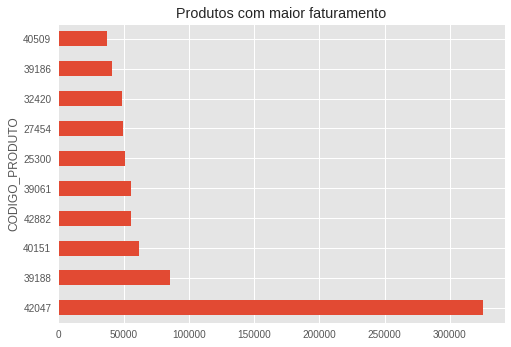

In [ ]:
faturamento_por_produto.head(10).plot.barh(title="Produtos com maior faturamento")

In [ ]:
faturamento_por_produto.tail(10)

CODIGO_PRODUTO
48919   $0.01
48948   $0.01
50086   $0.01
48974   $0.01
48972   $0.01
48966   $0.01
48965   $0.01
48949   $0.01
44712   $0.01
51317   $0.00
Name: faturamento, dtype: float64

In [ ]:
import datetime
...

data_inicio = datetime.datetime(2019, 3, 1)
data_final = datetime.datetime(2019, 3, 30)

vendas1_filtrado_marco= vendas1[(data_inicio <= vendas1["DATA_MOVIMENTO"]) &  (data_final > vendas1["DATA_MOVIMENTO"]) ]

In [ ]:
vendas1_filtrado_marco

,Unnamed: 0,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,CEP_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,valorempresa,valorconcorrencia,DIA_VENDA,MES_VENDA,ANO_VENDA,FATURAMENTOliquido,FATURAMENTOmedio,faturamento
0,322691,2019-03-01,1,CE,60025-001,A,43794,9,1,1,8,$57.38,1,$57.38,Promo Gold,0,$nan,$nan,1,3,2019,$57.38,$57.38,$57.38
1,117713,2019-03-01,1,CE,60025-001,A,32859,6,1,0,4,$3.80,0,$0.00,SEMPROMOCAO,0,$nan,$nan,1,3,2019,$0.00,$3.80,$3.80
2,55079,2019-03-01,1,CE,60025-001,A,19382,7,1,1,7,$7.01,1,$7.01,Promo Gold,0,$6.80,$7.33,1,3,2019,$7.01,$7.01,$7.01
3,55060,2019-03-01,1,CE,60025-001,A,18537,319,10,0,302,$3.85,10,$3.85,Promo Gold,0,$4.35,$3.93,1,3,2019,$38.45,$38.45,$38.45
4,9117,2019-03-01,1,CE,60025-001,A,1397,7,2,0,5,$62.10,2,$62.10,Promo Venda,0,$61.50,$57.07,1,3,2019,$124.20,$124.20,$124.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51186,331193,2019-03-29,1,CE,60025-001,A,48147,4,1,0,2,$7.30,1,$7.30,Promo Venda,0,$nan,$nan,29,3,2019,$7.30,$7.30,$7.30
51187,155606,2019-03-29,1,CE,60025-001,A,30014,3,1,0,2,$14.89,1,$14.89,Encarte,0,$20.60,$17.99,29,3,2019,$14.89,$14.89,$14.89
51188,329858,2019-03-29,1,CE,60025-001,A,49966,6,1,0,5,$27.74,1,$27.74,Promo Gold,0,$nan,$nan,29,3,2019,$27.74,$27.74,$27.74
51189,137236,2019-03-29,1,CE,60025-001,A,26717,5,1,0,4,$20.79,1,$20.79,Encarte,0,$22.90,$24.49,29,3,2019,$20.79,$20.79,$20.79


In [ ]:
vendas1_filtrado_marco.faturamento.sum()

2141893.4141450003

In [ ]:
data_inicio_abril = datetime.datetime(2019, 4, 1)
data_final_abril = datetime.datetime(2019, 4, 30)

vendas1_filtrado_abril= vendas1[(data_inicio_abril<= vendas1["DATA_MOVIMENTO"]) &  (data_final_abril > vendas1["DATA_MOVIMENTO"]) ]

In [ ]:
vendas1_filtrado_abril.faturamento.sum()

2105784.194059

In [ ]:
faturamento_por_produto_abril = vendas1.groupby(by=['CODIGO_PRODUTO'])['faturamento'].sum().sort_values(ascending=False)

In [ ]:
faturamento_por_produto_abril

CODIGO_PRODUTO
42047   $325,782.31
39188    $85,368.89
40151    $61,582.10
42882    $56,020.56
39061    $55,346.29
            ...    
48966         $0.01
48965         $0.01
48949         $0.01
44712         $0.01
51317         $0.00
Name: faturamento, Length: 11542, dtype: float64

In [ ]:
vendas1.isnull().sum()

Unnamed: 0                      0
DATA_MOVIMENTO                  0
CODIGO_FILIAL                   0
UF_FILIAL                       0
CEP_FILIAL                      0
STATUS_FILIAL                   0
CODIGO_PRODUTO                  0
ESTOQUE_ANTERIOR                0
MVVP_QT_PRD                     0
QT_MOV_ENTRADA                  0
ESTOQUE_FIM_DIA                 0
PRECO_MEDIO_VENDA               0
QTD_VENDA_PROMOCAO              0
PRECO_LIQUIDO_MEDIO             0
TIPO_PROMOCAO                  44
QTD_VENDA_ULTIMA_CHANCE         0
valorempresa               195911
valorconcorrencia          195911
DIA_VENDA                       0
MES_VENDA                       0
ANO_VENDA                       0
FATURAMENTOliquido              0
FATURAMENTOmedio                0
faturamento                     0
dtype: int64

### ABAIXO DAQUI, KMEANS E TESTES

* incluir outras lojas no df
* faturamento total de cada filial

* kmeans dividindo em tres
adicionar coluna classe tres tipos
* dividir treino teste
* aplicar sklearn testes


In [1]:
## importações de bilbiotecas
import pandas as pd
from os import listdir
from os.path import isfile, join
from google.colab import drive
import seaborn as sns

drive.mount('/gdrive')

Mounted at /gdrive


In [2]:
pip install pycaret

     |████████████████████████████████| 266kB 7.6MB/s 
     |████████████████████████████████| 1.7MB 15.1MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 14.2MB 291kB/s 
     |████████████████████████████████| 2.0MB 43.1MB/s 
     |████████████████████████████████| 61kB 10.8MB/s 
     |████████████████████████████████| 215kB 51.5MB/s 
     |████████████████████████████████| 102kB 14.9MB/s 
     |████████████████████████████████| 81kB 13.1MB/s 
     |████████████████████████████████| 276kB 47.5MB/s 
     |████████████████████████████████| 6.8MB 18.0MB/s 
     |████████████████████████████████| 245kB 43.6MB/s 
     |████████████████████████████████| 61kB 11.1MB/s 
     |████████████████████████████████| 153kB 41.6MB/s 
     |████████████████████████████████| 378kB 41.1MB/s 
     |████████████████████████████████| 163kB 46.0M

In [3]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [4]:

## adicionando o caminho dos dados
mypath='/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
## criando um dataframe vazio
df = pd.DataFrame()

In [5]:
## adicionando os dados em um unico dataframe
for file in onlyfiles:
  caminho = mypath + file
  dados = pd.read_csv(caminho)
  df = df.append(dados)
  print(caminho + ' - Adicionado!')

/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_23_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_1_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_15_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_31_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_27_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_72_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_37_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_11_clean.csv - Adicionado!
/gdrive/MyDrive/Classroom

In [6]:
## conferindo se o dataframe foi preenchido
df.shape

(2994352, 18)

In [ ]:
df.STATUS_FILIAL.unique()

array(['A', 'F'], dtype=object)

In [ ]:
df.STATUS_FILIAL.value_counts()

A    2992557
F       1795
Name: STATUS_FILIAL, dtype: int64

In [ ]:
## verificando os tipos de dados
df.dtypes

Unnamed: 0                   int64
DATA_MOVIMENTO              object
CODIGO_FILIAL                int64
UF_FILIAL                   object
CEP_FILIAL                  object
STATUS_FILIAL               object
CODIGO_PRODUTO               int64
ESTOQUE_ANTERIOR           float64
MVVP_QT_PRD                  int64
QT_MOV_ENTRADA               int64
ESTOQUE_FIM_DIA            float64
PRECO_MEDIO_VENDA          float64
QTD_VENDA_PROMOCAO           int64
PRECO_LIQUIDO_MEDIO        float64
TIPO_PROMOCAO               object
QTD_VENDA_ULTIMA_CHANCE      int64
valorempresa               float64
valorconcorrencia          float64
dtype: object

In [19]:
## alterando o tipo da coluna DATA_MOVIMENTO
df['DATA_MOVIMENTO'] = pd.to_datetime(df['DATA_MOVIMENTO'])

In [40]:
dfcaret['DIA_DA_SEMANA']= df['DATA_MOVIMENTO'].dt.weekday
dfcaret

,CODIGO_FILIAL,STATUS_FILIAL,MVVP_QT_PRD,QT_MOV_ENTRADA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,DIA_DA_SEMANA
0,23,A,1,0,1,0,0
1,23,A,1,0,1,0,2
2,23,A,1,0,1,0,4
3,23,A,1,0,1,0,5
4,23,A,1,0,1,0,3
...,...,...,...,...,...,...,...
202044,67,A,2,0,2,0,0
202045,67,A,1,0,1,0,3
202046,67,A,1,0,1,0,2
202047,67,A,1,0,1,0,0


In [28]:
## formata a saída de números float
pd.options.display.float_format = '${:,.2f}'.format

In [10]:
## criando a coluna faturamento
df['FATURAMENTO'] = ((df['MVVP_QT_PRD']  * df['PRECO_LIQUIDO_MEDIO']))

In [29]:
## recuperando o nome das colunas
df.columns.to_list()

['DATA_MOVIMENTO',
 'CODIGO_FILIAL',
 'UF_FILIAL',
 'STATUS_FILIAL',
 'CODIGO_PRODUTO',
 'MVVP_QT_PRD',
 'QT_MOV_ENTRADA',
 'PRECO_MEDIO_VENDA',
 'QTD_VENDA_PROMOCAO',
 'PRECO_LIQUIDO_MEDIO',
 'TIPO_PROMOCAO',
 'QTD_VENDA_ULTIMA_CHANCE']

In [32]:
## verificando dados null
df.isnull().sum()

DATA_MOVIMENTO             0
CODIGO_FILIAL              0
UF_FILIAL                  0
STATUS_FILIAL              0
CODIGO_PRODUTO             0
MVVP_QT_PRD                0
QT_MOV_ENTRADA             0
PRECO_MEDIO_VENDA          0
QTD_VENDA_PROMOCAO         0
PRECO_LIQUIDO_MEDIO        0
TIPO_PROMOCAO              0
QTD_VENDA_ULTIMA_CHANCE    0
dtype: int64

In [33]:
## verificando dados NaN
df.isna().sum()

DATA_MOVIMENTO             0
CODIGO_FILIAL              0
UF_FILIAL                  0
STATUS_FILIAL              0
CODIGO_PRODUTO             0
MVVP_QT_PRD                0
QT_MOV_ENTRADA             0
PRECO_MEDIO_VENDA          0
QTD_VENDA_PROMOCAO         0
PRECO_LIQUIDO_MEDIO        0
TIPO_PROMOCAO              0
QTD_VENDA_ULTIMA_CHANCE    0
dtype: int64

In [34]:
## preenchendo dados faltantes com 0 (zero)
df.fillna(0, inplace=True)

In [14]:
df.isna().sum()

Unnamed: 0                 0
DATA_MOVIMENTO             0
CODIGO_FILIAL              0
UF_FILIAL                  0
CEP_FILIAL                 0
STATUS_FILIAL              0
CODIGO_PRODUTO             0
ESTOQUE_ANTERIOR           0
MVVP_QT_PRD                0
QT_MOV_ENTRADA             0
ESTOQUE_FIM_DIA            0
PRECO_MEDIO_VENDA          0
QTD_VENDA_PROMOCAO         0
PRECO_LIQUIDO_MEDIO        0
TIPO_PROMOCAO              0
QTD_VENDA_ULTIMA_CHANCE    0
valorempresa               0
valorconcorrencia          0
FATURAMENTO                0
dtype: int64

In [35]:
df = df.drop(columns=['Unnamed: 0','CEP_FILIAL','ESTOQUE_ANTERIOR','ESTOQUE_FIM_DIA','valorempresa','valorconcorrencia','FATURAMENTO'])

KeyError: ignored

In [36]:
df.columns

Index(['DATA_MOVIMENTO', 'CODIGO_FILIAL', 'UF_FILIAL', 'STATUS_FILIAL',
       'CODIGO_PRODUTO', 'MVVP_QT_PRD', 'QT_MOV_ENTRADA', 'PRECO_MEDIO_VENDA',
       'QTD_VENDA_PROMOCAO', 'PRECO_LIQUIDO_MEDIO', 'TIPO_PROMOCAO',
       'QTD_VENDA_ULTIMA_CHANCE'],
      dtype='object')

In [38]:
lojas_kmens = df.copy()
lojas_kmens=lojas_kmens.drop(['CODIGO_PRODUTO','DATA_MOVIMENTO','PRECO_MEDIO_VENDA','UF_FILIAL','PRECO_LIQUIDO_MEDIO','TIPO_PROMOCAO'], axis=1)
lojas_kmens

,CODIGO_FILIAL,STATUS_FILIAL,MVVP_QT_PRD,QT_MOV_ENTRADA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE
0,23,A,1,0,1,0
1,23,A,1,0,1,0
2,23,A,1,0,1,0
3,23,A,1,0,1,0
4,23,A,1,0,1,0
...,...,...,...,...,...,...
202044,67,A,2,0,2,0
202045,67,A,1,0,1,0
202046,67,A,1,0,1,0
202047,67,A,1,0,1,0


In [39]:
dfcaret = lojas_kmens.copy()
dfcaret

,CODIGO_FILIAL,STATUS_FILIAL,MVVP_QT_PRD,QT_MOV_ENTRADA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE
0,23,A,1,0,1,0
1,23,A,1,0,1,0
2,23,A,1,0,1,0
3,23,A,1,0,1,0
4,23,A,1,0,1,0
...,...,...,...,...,...,...
202044,67,A,2,0,2,0
202045,67,A,1,0,1,0
202046,67,A,1,0,1,0
202047,67,A,1,0,1,0


In [ ]:
lojas_kmens

,CODIGO_FILIAL,STATUS_FILIAL,MVVP_QT_PRD,QT_MOV_ENTRADA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,FATURAMENTO
0,23,A,1,0,1,0,$24.60
1,23,A,1,0,1,0,$5.00
2,23,A,1,0,1,0,$27.08
3,23,A,1,0,1,0,$5.69
4,23,A,1,0,1,0,$5.00
...,...,...,...,...,...,...,...
202044,67,A,2,0,2,0,$69.98
202045,67,A,1,0,1,0,$14.90
202046,67,A,1,0,1,0,$14.70
202047,67,A,1,0,1,0,$9.90


In [ ]:
!pip install matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

In [ ]:
#Montando dados para clusterização

lojas = lojas_kmens.groupby('CODIGO_FILIAL')['FATURAMENTO'].sum().reset_index()
lojas

,CODIGO_FILIAL,FATURAMENTO
0,1,"$14,045,850.08"
1,3,"$1,665,843.70"
2,5,"$4,100,507.65"
3,11,"$1,675,361.07"
4,15,"$1,995,287.68"
5,18,"$4,985,260.38"
6,20,"$5,045,037.42"
7,22,"$1,800,447.49"
8,23,"$1,648,270.69"
9,27,"$2,951,944.62"


In [ ]:
#Montando dados para clusterização

lojas = lojas_kmens.groupby('CODIGO_FILIAL')['FATURAMENTO'].sum().reset_index()
lojas

,CODIGO_FILIAL,FATURAMENTO
0,1,"$14,045,850.08"
1,3,"$1,665,843.70"
2,5,"$4,100,507.65"
3,11,"$1,675,361.07"
4,15,"$1,995,287.68"
5,18,"$4,985,260.38"
6,20,"$5,045,037.42"
7,22,"$1,800,447.49"
8,23,"$1,648,270.69"
9,27,"$2,951,944.62"


In [ ]:
#Montando dados para clusterização

lojas = lojas_kmens.groupby('CODIGO_FILIAL')['FATURAMENTO'].sum().reset_index()
lojas

,CODIGO_FILIAL,FATURAMENTO
0,1,"$14,045,850.08"
1,3,"$1,665,843.70"
2,5,"$4,100,507.65"
3,11,"$1,675,361.07"
4,15,"$1,995,287.68"
5,18,"$4,985,260.38"
6,20,"$5,045,037.42"
7,22,"$1,800,447.49"
8,23,"$1,648,270.69"
9,27,"$2,951,944.62"


In [ ]:
lojas.dtypes

CODIGO_FILIAL      int64
FATURAMENTO      float64
dtype: object

In [ ]:
from sklearn.cluster import KMeans

N_CLUSTERS = 3

kmeans = KMeans(
    n_clusters=N_CLUSTERS,
    max_iter=500,
    n_init=10,
    n_jobs=-1,
    random_state=1
)

kmeans.fit(lojas)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=3, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=1, tol=0.0001, verbose=0)

In [ ]:
lojas['clusters'] = kmeans.labels_

In [ ]:
lojas

,CODIGO_FILIAL,FATURAMENTO,clusters
0,1,"$14,045,850.08",2
1,3,"$1,665,843.70",0
2,5,"$4,100,507.65",1
3,11,"$1,675,361.07",0
4,15,"$1,995,287.68",0
5,18,"$4,985,260.38",1
6,20,"$5,045,037.42",1
7,22,"$1,800,447.49",0
8,23,"$1,648,270.69",0
9,27,"$2,951,944.62",0


In [ ]:
for i in range(N_CLUSTERS):
    print('cluster', i + 1)
    print(lojas[lojas['clusters'] == i].head(5))
    print('\n----\n')

cluster 1
   CODIGO_FILIAL   FATURAMENTO  clusters
1              3 $1,665,843.70         0
3             11 $1,675,361.07         0
4             15 $1,995,287.68         0
7             22 $1,800,447.49         0
8             23 $1,648,270.69         0

----

cluster 2
    CODIGO_FILIAL   FATURAMENTO  clusters
2               5 $4,100,507.65         1
5              18 $4,985,260.38         1
6              20 $5,045,037.42         1
10             31 $4,458,574.85         1
11             36 $7,469,679.33         1

----

cluster 3
   CODIGO_FILIAL    FATURAMENTO  clusters
0              1 $14,045,850.08         2

----



In [ ]:
#Organizando as lojas baseando no faturado e cluster

lojas.sort_values(['FATURAMENTO','clusters'])

,CODIGO_FILIAL,FATURAMENTO,clusters
8,23,"$1,648,270.69",0
1,3,"$1,665,843.70",0
3,11,"$1,675,361.07",0
16,58,"$1,700,903.41",0
7,22,"$1,800,447.49",0
4,15,"$1,995,287.68",0
19,72,"$2,303,822.58",0
14,46,"$2,893,941.92",0
9,27,"$2,951,944.62",0
15,57,"$3,243,332.39",0


In [ ]:
X = lojas.drop(['clusters'], axis=1)
y = lojas['clusters']

In [ ]:
from sklearn.preprocessing import *
import re
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y, 
    test_size=0.33, 
    random_state=1
)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(13, 2) (13,)
(7, 2) (7,)


In [ ]:
model = DecisionTreeClassifier(
    max_depth=4,
    criterion='entropy',
    random_state=1
)

model.fit(
    X_train, y_train
)

y_pred = model.predict(X_test)
y_pred

array([0, 0, 1, 1, 1, 0, 0], dtype=int32)

In [ ]:
# Avalia com a métrica de acurácia
metrics.accuracy_score(
    y_test, # Valor esperado
    y_pred # Valor previsto
)

1.0

In [ ]:
import numpy as np

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(
    model,
    X,
    y, 
    cv=3,
    scoring='accuracy',
    n_jobs=-1
)

print('Score de cada fold', scores)
print('Acurácia média:', np.mean(scores))
print('Desvio padrão:', np.std(scores))

Score de cada fold [0.85714286 1.         1.        ]
Acurácia média: 0.9523809523809524
Desvio padrão: 0.0673435029701474


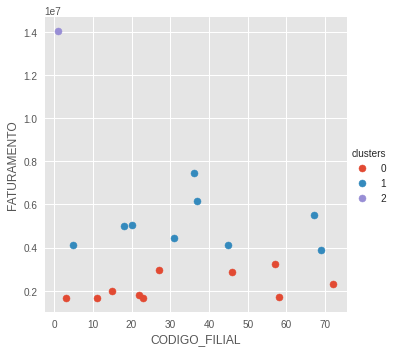

In [ ]:
sns.FacetGrid(
    lojas, 
    hue='clusters',
    height=5
).map(
    plt.scatter, 'CODIGO_FILIAL', 'FATURAMENTO'
).add_legend()

# vendas - estimar vendas dos proximos display

vendas - estimar vendas dos proximos dias.
pycaret - regressao

estimar valor considerando 


vendas agrupadas por cada dia de cada loja


In [ ]:
pip install pycaret

In [ ]:
from pycaret.datasets import get_data
dataset = get_data('diamond')

,Carat Weight,Cut,Color,Clarity,Polish,Symmetry,Report,Price
0,$1.10,Ideal,H,SI1,VG,EX,GIA,5169
1,$0.83,Ideal,H,VS1,ID,ID,AGSL,3470
2,$0.85,Ideal,H,SI1,EX,EX,GIA,3183
3,$0.91,Ideal,E,SI1,VG,VG,GIA,4370
4,$0.83,Ideal,G,SI1,EX,EX,GIA,3171


In [61]:
from pycaret.datasets import get_data
dataset = vendas1.copy()

In [62]:
dataset.shape


(346898, 11)

In [63]:
data = dataset.sample(frac=0.9, random_state=786)
data_unseen = dataset.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (312208, 11)
Unseen Data For Predictions: (34690, 11)


In [64]:
from pycaret.regression import *
exp_reg101 = setup(data = data, target = 'MVVP_QT_PRD', session_id=123)


,Description,Value
0,session_id,123
1,Target,MVVP_QT_PRD
2,Original Data,"(312208, 11)"
3,Missing Values,False
4,Numeric Features,5
5,Categorical Features,5
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(218545, 23)"


In [65]:
best = compare_models(exclude = ['ransac'])


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,$0.02,$0.20,$0.44,$0.98,$0.05,$0.01,$16.77
rf,Random Forest Regressor,$0.02,$0.22,$0.45,$0.98,$0.05,$0.01,$25.43
gbr,Gradient Boosting Regressor,$0.03,$0.23,$0.47,$0.98,$0.05,$0.02,$18.75
dt,Decision Tree Regressor,$0.02,$0.30,$0.54,$0.97,$0.06,$0.01,$0.42
lr,Linear Regression,$0.10,$0.53,$0.72,$0.95,$0.13,$0.06,$0.36
ridge,Ridge Regression,$0.10,$0.53,$0.72,$0.95,$0.13,$0.06,$0.06
lar,Least Angle Regression,$0.10,$0.53,$0.72,$0.95,$0.13,$0.06,$0.07
br,Bayesian Ridge,$0.10,$0.53,$0.72,$0.95,$0.13,$0.06,$0.23
lightgbm,Light Gradient Boosting Machine,$0.03,$0.63,$0.75,$0.95,$0.05,$0.01,$1.19
omp,Orthogonal Matching Pursuit,$0.10,$0.56,$0.74,$0.95,$0.15,$0.06,$0.07


In [66]:
models()


,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [67]:
ada = create_model('ada')


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,$1.05,$2.65,$1.63,$0.77,$0.39,$0.81
1,$1.09,$2.26,$1.50,$0.87,$0.41,$0.87
2,$0.96,$2.15,$1.47,$0.86,$0.36,$0.70
3,$0.96,$2.32,$1.52,$0.78,$0.36,$0.67
4,$1.14,$2.73,$1.65,$0.64,$0.42,$0.90
5,$1.05,$2.63,$1.62,$0.72,$0.39,$0.76
6,$1.51,$4.20,$2.05,$0.68,$0.53,$1.20
7,$0.88,$1.89,$1.37,$0.84,$0.36,$0.72
8,$1.74,$4.65,$2.16,$0.50,$0.58,$1.42
9,$1.16,$2.40,$1.55,$0.80,$0.43,$0.89


In [68]:
print(ada)


AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=123)


In [69]:
lightgbm = create_model('lightgbm')


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,$0.03,$0.69,$0.83,$0.94,$0.05,$0.01
1,$0.05,$1.90,$1.38,$0.89,$0.06,$0.01
2,$0.04,$1.03,$1.02,$0.93,$0.05,$0.01
3,$0.03,$0.37,$0.61,$0.96,$0.05,$0.01
4,$0.03,$0.25,$0.50,$0.97,$0.05,$0.01
5,$0.03,$0.32,$0.56,$0.97,$0.05,$0.01
6,$0.03,$0.23,$0.48,$0.98,$0.06,$0.01
7,$0.04,$0.49,$0.70,$0.96,$0.05,$0.01
8,$0.03,$0.31,$0.56,$0.97,$0.05,$0.01
9,$0.03,$0.69,$0.83,$0.94,$0.05,$0.01


In [72]:
dt = create_model('dt')


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,$0.03,$0.31,$0.56,$0.97,$0.06,$0.01
1,$0.02,$0.38,$0.62,$0.98,$0.06,$0.01
2,$0.03,$0.36,$0.60,$0.98,$0.06,$0.01
3,$0.02,$0.17,$0.42,$0.98,$0.06,$0.01
4,$0.02,$0.26,$0.51,$0.96,$0.06,$0.01
5,$0.03,$0.32,$0.56,$0.97,$0.06,$0.01
6,$0.02,$0.15,$0.39,$0.99,$0.06,$0.01
7,$0.03,$0.51,$0.72,$0.96,$0.06,$0.01
8,$0.02,$0.17,$0.41,$0.98,$0.06,$0.01
9,$0.02,$0.38,$0.61,$0.97,$0.06,$0.01


In [ ]:
tuned_ada = tune_model(ada)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,$0.52,$1.18,$1.08,$0.90,$0.20,$0.27
1,$0.51,$1.29,$1.14,$0.92,$0.19,$0.27
2,$0.51,$1.17,$1.08,$0.93,$0.19,$0.27
3,$0.51,$0.98,$0.99,$0.91,$0.19,$0.27
4,$0.52,$1.30,$1.14,$0.83,$0.19,$0.27
5,$0.50,$1.21,$1.10,$0.87,$0.20,$0.27
6,$0.51,$1.03,$1.02,$0.92,$0.19,$0.27
7,$0.51,$1.52,$1.23,$0.87,$0.19,$0.27
8,$0.51,$1.26,$1.12,$0.86,$0.20,$0.27
9,$0.47,$0.80,$0.89,$0.93,$0.18,$0.26


In [ ]:
print(tuned_ada)


AdaBoostRegressor(base_estimator=None, learning_rate=0.05, loss='linear',
                  n_estimators=90, random_state=123)


In [ ]:
import numpy as np
lgbm_params = {'num_leaves': np.arange(10,200,10),
                        'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
                        'learning_rate': np.arange(0.1,1,0.1)
                        }

In [ ]:
tuned_lightgbm = tune_model(lightgbm, custom_grid = lgbm_params)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,$649.25,"$1,131,046.48","$1,063.51",$0.99,$0.07,$0.05
1,$785.82,"$5,518,411.79","$2,349.13",$0.96,$0.07,$0.05
2,$808.10,"$3,024,520.41","$1,739.11",$0.97,$0.08,$0.06
3,$749.79,"$1,774,260.28","$1,332.01",$0.98,$0.07,$0.06
4,$694.04,"$1,974,576.42","$1,405.20",$0.98,$0.08,$0.06
5,$841.65,"$6,725,524.07","$2,593.36",$0.94,$0.08,$0.06
6,$796.02,"$3,324,498.62","$1,823.32",$0.97,$0.08,$0.06
7,$713.10,"$1,872,493.11","$1,368.39",$0.98,$0.07,$0.06
8,$775.98,"$2,274,682.34","$1,508.20",$0.98,$0.08,$0.06
9,$768.35,"$3,247,098.54","$1,801.97",$0.97,$0.09,$0.06


In [ ]:
print(tuned_lightgbm)


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=60,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=120, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
tuned_dt = tune_model(dt)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,"$1,000.71","$2,895,159.13","$1,701.52",$0.97,$0.11,$0.08
1,"$1,080.28","$6,686,388.04","$2,585.81",$0.95,$0.11,$0.08
2,"$1,002.32","$3,275,429.63","$1,809.81",$0.97,$0.11,$0.08
3,"$1,080.79","$4,037,154.60","$2,009.27",$0.96,$0.12,$0.09
4,"$1,101.63","$7,889,520.54","$2,808.83",$0.90,$0.12,$0.08
5,"$1,275.59","$11,021,312.20","$3,319.84",$0.91,$0.12,$0.09
6,"$1,068.65","$4,463,866.30","$2,112.79",$0.96,$0.11,$0.08
7,$975.94,"$3,271,028.52","$1,808.60",$0.96,$0.11,$0.08
8,"$1,101.92","$4,441,966.36","$2,107.60",$0.96,$0.11,$0.09
9,"$1,065.17","$5,192,339.27","$2,278.67",$0.95,$0.12,$0.09


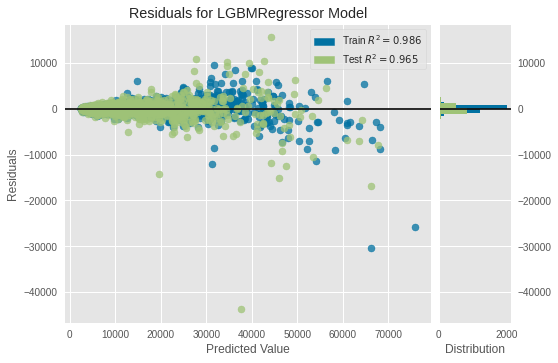

In [ ]:
plot_model(tuned_lightgbm)


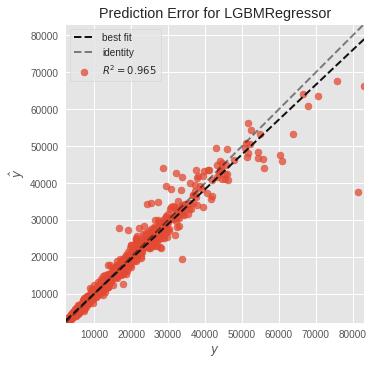

In [ ]:
plot_model(tuned_lightgbm, plot = 'error')


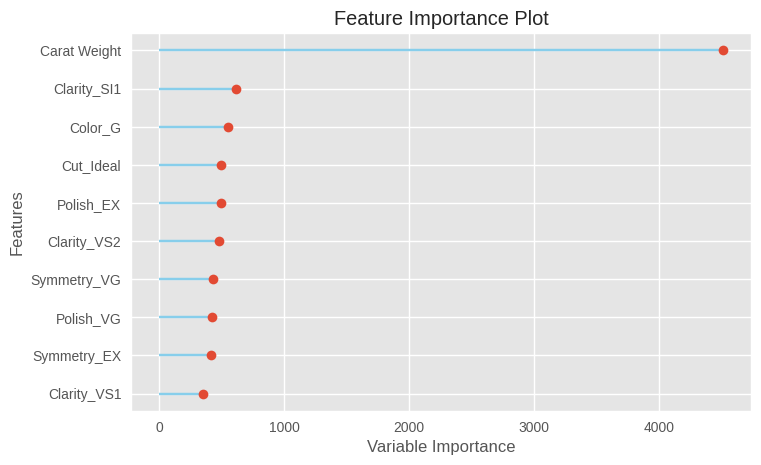

In [ ]:
plot_model(tuned_lightgbm, plot='feature')


In [ ]:
predict_model(tuned_lightgbm);


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,$781.56,"$3,816,757.28","$1,953.65",$0.97,$0.08,$0.06


In [ ]:
final_lightgbm = finalize_model(tuned_lightgbm)


In [ ]:
print(final_lightgbm)


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=60,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=120, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
predict_model(final_lightgbm);


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,$459.92,"$1,199,892.03","$1,095.40",$0.99,$0.05,$0.04


In [ ]:
unseen_predictions = predict_model(final_lightgbm, data=data_unseen)
unseen_predictions.head()

,Carat Weight,Cut,Color,Clarity,Polish,Symmetry,Report,Price,Label
0,$1.53,Ideal,E,SI1,ID,ID,AGSL,12791,"$12,262.95"
1,$1.50,Fair,F,SI1,VG,VG,GIA,10450,"$10,122.44"
2,$1.01,Good,E,SI1,G,G,GIA,5161,"$5,032.52"
3,$2.51,Very Good,G,VS2,VG,VG,GIA,34361,"$34,840.38"
4,$1.01,Good,I,SI1,VG,VG,GIA,4238,"$4,142.70"


In [ ]:

from pycaret.utils import check_metric
check_metric(unseen_predictions.Price, unseen_predictions.Label, 'R2')

0.9779

In [ ]:
save_model(final_lightgbm,'Final LightGBM Model 25Nov2020')


Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='Price',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='...
                  LGBMRegressor(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=60,
                                min_child_samples=20, min_child_weight=0.001,
                  

In [ ]:
saved_final_lightgbm = load_model('Final LightGBM Model 25Nov2020')


Transformation Pipeline and Model Successfully Loaded


In [ ]:
new_prediction = predict_model(saved_final_lightgbm, data=data_unseen)


In [ ]:
new_prediction.head()


,Carat Weight,Cut,Color,Clarity,Polish,Symmetry,Report,Price,Label
0,$1.53,Ideal,E,SI1,ID,ID,AGSL,12791,"$12,262.95"
1,$1.50,Fair,F,SI1,VG,VG,GIA,10450,"$10,122.44"
2,$1.01,Good,E,SI1,G,G,GIA,5161,"$5,032.52"
3,$2.51,Very Good,G,VS2,VG,VG,GIA,34361,"$34,840.38"
4,$1.01,Good,I,SI1,VG,VG,GIA,4238,"$4,142.70"


In [ ]:
from pycaret.utils import check_metric
check_metric(new_prediction.Price, new_prediction.Label, 'R2')

0.9779